## Nick Falls
### XZT6ZR
### ECE 6750
### HW2


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import wave
from IPython.display import Audio

## DFT Audio Signal Analysis

You will be using the fast Fourier transform (FFT) to analyze two audio signals. These are a clip of a person speaking (``winniethepooh.wav`` : Chapter 5 of A. A. Milne's classic, *Winnie the Pooh*, read by Phil Chenevert, audio from LibriVox: https://librivox.org/winnie-the-pooh-by-a-a-milne/) and a clip of piano music (``bach.wav`` : J. S. Bach's *Two Part Invention Number 13 in A Minor*). Download these files from the class webpage.


## Question 1:

The frequency band for voice used in telephones is approximately 300 to 3400 Hz. (https://en.wikipedia.org/wiki/Voice_frequency). To simulate this, take the FFT of the voice audio signal and apply a bandpass filter in the voice frequency range. That is, set the $Y[k] = w[k] X[k]$, where $w[k]$ is set to one for frequencies in the 300--3400 Hz range and set to zero elsewhere. **Note:** you will need to first calculate the conversion of the frequency parameter $k$ into Hz. Take the inverse FFT and listen to the resulting audio.

## Answer:

In [46]:
# This code reads in the wav file as a numpy array
voice_file = wave.open("winniethepooh.wav")
L = voice_file.getnframes()
print("L=",L)
voice_signal = np.frombuffer(voice_file.readframes(L), dtype = np.int16)

# Converting the signal values to float for better numerical processing
voice_signal = voice_signal.astype(float)

# The frame rate, or sampling rate, in Hz
fs = voice_file.getframerate()
print("fs=", fs)

# Play the audio interactively in the notebook
voice_audio = Audio(data = voice_signal, rate = fs)

print("Voice Original")
voice_audio

L= 2116800
fs= 44100
Voice Original


Nsamples 352800


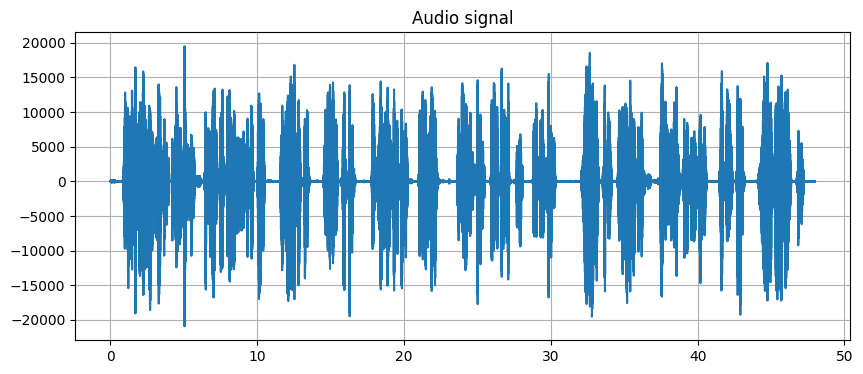

In [61]:
#Plot a piece of the voice signal out of curiosity
Nsamples= int(fs*8)
print("Nsamples", Nsamples)
start_time = 0 #in seconds
window = 48 #in seconds
N_start = int(start_time*fs)
N_end = int((start_time+window)*fs)
t = np.arange(N_end-N_start)/fs+start_time

plt.figure(figsize=(10,4))
plt.plot(t, voice_signal[N_start:N_end])
plt.title("Audio signal")
plt.grid(True)
plt.show()

freq_res= 0.020833333333333332


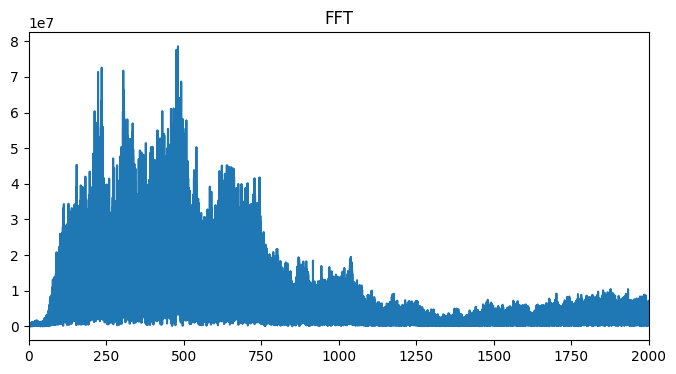

In [67]:
#perform FFT, find frequency steps based on our sampling rate
#and signal length, and plot this waveform. Plot only magnitude of resulting 
#complex signal, not interested in phase right now. 
print("freq_res=", fs/L)
voice_fft = np.fft.rfft(voice_signal)
#I asked ChatGPT if there was a better way to find the frequency steps for a 
#FFT. I could find frequency resolution with fs/L but turning this into an 
#appropriately sized array seemed clunky the way I was trying
frequency = np.fft.rfftfreq(L, 1/fs)

plt.figure(figsize=(8,4))
plt.plot(frequency,np.abs(voice_fft))
plt.xlim(0, 2000)
plt.title("FFT")
plt.show()

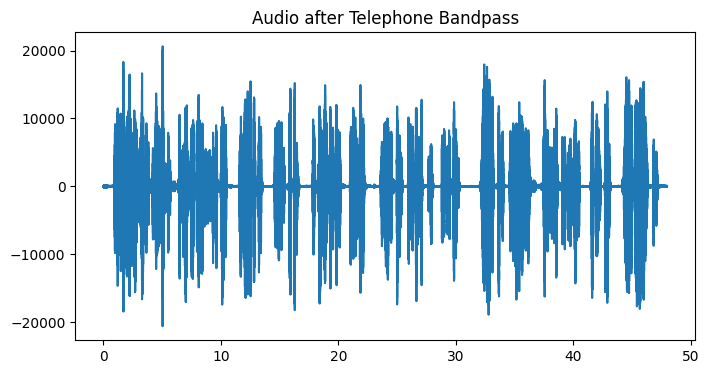

In [63]:
#Filter time
#I had CHatGPT help me make the w array. I prompted "give me a python command to 
#determine which elements in an array are between 300 and 3400. I need the resulting
#array returned as an int so I can multiply by an array of ints"
#So this line moves through each element of the frequency array and returns
#1.0 (needed a float actually) for frequency values that are in our desired spectrum
w = ((frequency >= 300) & (frequency <= 3400)).astype(float)
Y = voice_fft*w
voice_signal_TPbandpass = np.fft.irfft(Y, L)

x_axis_1 = np.arange(L)/fs

plt.figure(figsize=(8,4))
plt.plot(x_axis_1,(voice_signal_TPbandpass))
#plt.xlim(0, 2000)
plt.title("Audio after Telephone Bandpass")
plt.show()

In [69]:
#Play filtered audio
voice_audio_filtered = Audio(data = voice_signal_TPbandpass, rate = fs)

print("Voice after Telephone Bandpass")
voice_audio_filtered

Voice after Telephone Bandpass


This filtered audio reminds of of an old school radio broadcast. 

## Question 2:

According to the same Wikipedia page, the fundamental frequency of a male speaking voice is between 85 to 155 Hz. Apply the same bandpass filter procedure as above, but with the frequency range of 85--310 Hz. (We have to double the upper limit of the frequency range to avoid aliasing. This is due to what is called the Nyquist-Shannon theorem, which we'll cover later in class!) Again, listen to the resulting audio. Is the speech still understandable when keeping only the fundamental frequencies, or were the harmonic overtones important contributions?

## Answer:

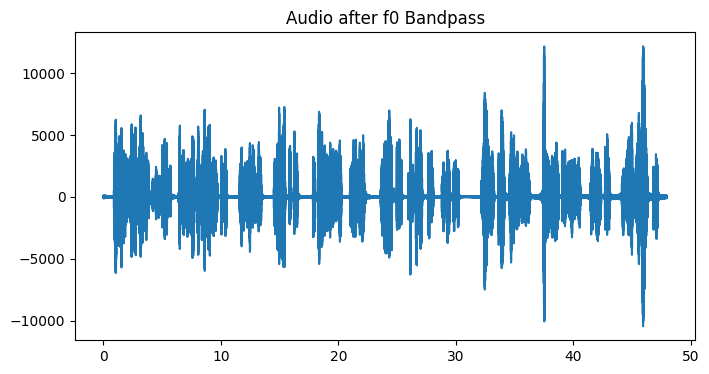

In [70]:
w2 = ((freq >= 85)&(freq <=310)).astype(float)
Y2 = voice_fft*w2
voice_signal_f0bandpass = np.fft.irfft(Y2, L)

x_axis_2 = np.arange(L)/fs

plt.figure(figsize=(8,4))
plt.plot(x_axis_1,(voice_signal_f0bandpass))
#plt.xlim(0, 2000)
plt.title("Audio after f0 Bandpass")
plt.show()

In [71]:
#Play filtered audio
voice_audio_filtered_f0 = Audio(data = voice_signal_f0bandpass, rate = fs)

print("Voice after f0 Bandpass")
voice_audio_filtered_f0

Voice after f0 Bandpass


The harmonics are absolutely necessary, the audio is extremely muffled. Almost as if the speaker is underwater. 

## Question 3:

Now compute an FFT of the piano music signal. Plot the magnitude of the FFT, $|X[k]|$, as a function of frequency in Hz. What are the 3 most prominent frequencies in Hz (a.k.a., what is the position on the frequency axis of the three highest peaks in the plot)? Refer to the following table of musical note frequencies:

https://en.wikipedia.org/wiki/Scientific_pitch_notation#Table_of_note_frequencies

What musical notes do these frequencies represent? Give the note letter and octave number, for example, 440 Hz is the note A4. **Hint: They may not be the notes you are expecting for a piece in the key of A minor!**

## Answer:

In [73]:
# This code reads in the wav file as a numpy array
bach_file = wave.open("bach.wav")
L_bach = bach_file.getnframes()
print("L_bach=",L_bach)
bach_signal = np.frombuffer(bach_file.readframes(L_bach), dtype = np.int16)

# Converting the signal values to float for better numerical processing
bach_signal = bach_signal.astype(float)

# The frame rate, or sampling rate, in Hz
fs_bach = bach_file.getframerate()
print("fs_bach=", fs_bach)

# Play the audio interactively in the notebook
bach_audio = Audio(data = bach_signal, rate = fs_bach)

print("Bach Original")
bach_audio

L_bach= 794304
fs_bach= 44100
Bach Original


freq_res= 0.05552030456852792


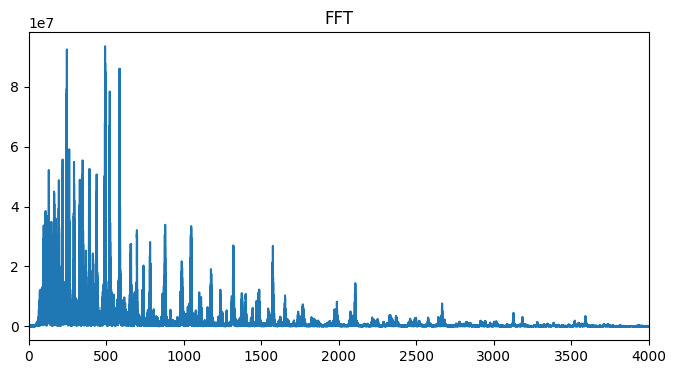

In [97]:
#perform FFT, find frequency steps based on our sampling rate
#and signal length, and plot this waveform. Plot only magnitude of resulting 
#complex signal, not interested in phase right now. 
print("freq_res=", fs_bach/L_bach)
bach_fft = np.fft.rfft(bach_signal)
frequency_bach = np.fft.rfftfreq(L_bach, 1/fs_bach)

plt.figure(figsize=(8,4))
plt.plot(frequency_bach,np.abs(bach_fft))
plt.xlim(0, 4000)
plt.title("FFT")
plt.show()

In [95]:
#I used ChatGPT to sort through my fft array to find the peaks
#I had to increase to top 10 indices because adjacent indices were getting
#flagged which was not my intention but was easy enough to get around
top_indices = np.argsort(bach_fft)[-10:][::-1]  
#print("top_indices=", top_indices)

print("Frequencies with largest magnitude:")
print(frequency_bach[10583])
print(frequency_bach[8910])
print(frequency_bach[4434])

Frequencies with largest magnitude:
587.571383248731
494.68591370558374
246.1770304568528


587.3 Hz = D5
493.9 Hz = B4
246.9 Hz = B3

## DFT Exercises

## Question 4:

Consider the following periodic signal, with period $L$:

  $$x[n] = \frac{1}{2}(\delta[n - 1] - \delta[n - L + 1]), \quad \quad \text{for $0 \leq n \leq L - 1$}.$$

* **(a)** Using the definition of the DFT analysis equation, compute $X[k]$. Simplify your equation until it is clear that $X[k]$ is imaginary (in the form of $i$ times a real number). **Show your steps.**

* **(b)** Now compute the DFT $X[k]$ by starting with a DFT pair we discussed in class and applying properties of the DFT. Confirm that it is equal to the answer you got in part (a). **Again, show your steps.**

* **(c)** In Python, construct the signal $x[n]$ for $L = 10$. Compute the DFT using the ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to a plot of your equation in part (a).

## Answer:

## (a)
Plugging $x[n]$ into our DFT analysis equation from class, noting that delta function is yields $0$ everywhere except $n=1$ and $n=L-1$. So the below is the sume valuated at these two indexes. 
$X[k] = \frac{1}{2\sqrt{L}} \left( e^{-i k \frac{2\pi}{L}} - e^{-i k (L-1)\frac{2\pi}{L}} \right)$ $\quad \text{Using exponential math}$

$e^{-i k (L-1)\frac{2\pi}{L}} 
= e^{-i \left(2\pi k - \frac{2\pi k}{L}\right)} 
= e^{-i 2\pi k} \, e^{+i \frac{2\pi k}{L}}$ $\quad \text{Noting}$ $e^{-i 2\pi k}=1$

$e^{-i k (L-1)\frac{2\pi}{L}} = e^{+i \frac{2\pi k}{L}}$

$\frac{1}{2\sqrt{L}} \left( e^{-i k \frac{2\pi}{L}} - e^{+i k \frac{2\pi}{L}} \right)$

$e^{-ix} - e^{+ix} = -2i \sin(x)$ $\quad \text{Identifying a sine identity}$

$\frac{1}{2\sqrt{L}} \left( e^{-i k \frac{2\pi}{L}} - e^{+i k \frac{2\pi}{L}} \right)
= \frac{1}{\sqrt{L}} \left( -i \sin\!\left(\tfrac{2\pi k}{L}\right) \right)$
## (b) 

From class we learned $x[n] = sin(\omega_0 m n)$ turns into $X[K]=\frac{i \sqrt{L}}{2}\,(-\delta[k-m] + \delta[k-L+m])$

So we can use the principle of duality to flip this around and get $X[n]$ is DFT of $x[L-k]$

Recognizing that our problem is negated and  $m=1$ yields

$x[k]= sin(\omega_0 k)$ where $\omega_0 = \frac{2\pi}{L}$

Recognizing our provided $x[n]$ is missing an $i\sqrt{L}$ need to account for this in our newly found $x[k]$

$x[k]= \frac{1}{i \sqrt{L}}sin(\frac{2\pi}{L} k)$

And knowing $\frac{1}{i}=-i$ we found the same answer as part A

$x[k]= \frac{-i}{\sqrt{L}}sin(\frac{2\pi}{L} k)$

## (c)

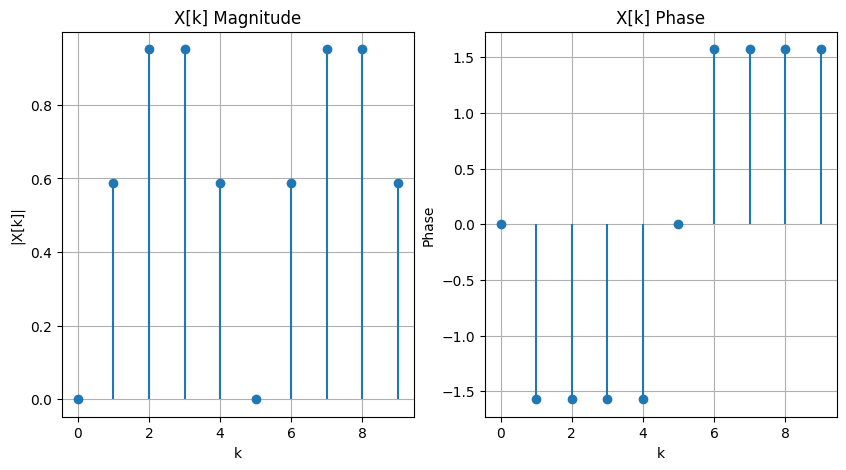

In [21]:
#I had to use ChatGPT to assist me with indexing of the DFT signal
#I came to realize since we were not given a real signal with a sample
#rate that I could not find my frequency index as in problem 1. I had
#ChatGPT show me how to index this DFT signal which turned out to be even
#simpler than problem 1 since we know from definition K is indexed from
#0 to L-1, same as n

L_4c = 10

x_4c = np.zeros(L_4c)
x_4c[1] = 0.5
x_4c[L_4c-1] = -0.5

X_4c = np.fft.fft(x_4c)
k_4c = np.arange(L_4c)

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.stem(k_4c, np.abs(X_4c), basefmt=" ")
plt.xlabel("k")
plt.ylabel("|X[k]|")
plt.title("X[k] Magnitude")
plt.grid(True)

plt.subplot(1,2,2)
plt.stem(k_4c, np.angle(X_4c), basefmt=" ")
plt.xlabel("k")
plt.ylabel("Phase")
plt.title("X[k] Phase")
plt.grid(True)
plt.show()

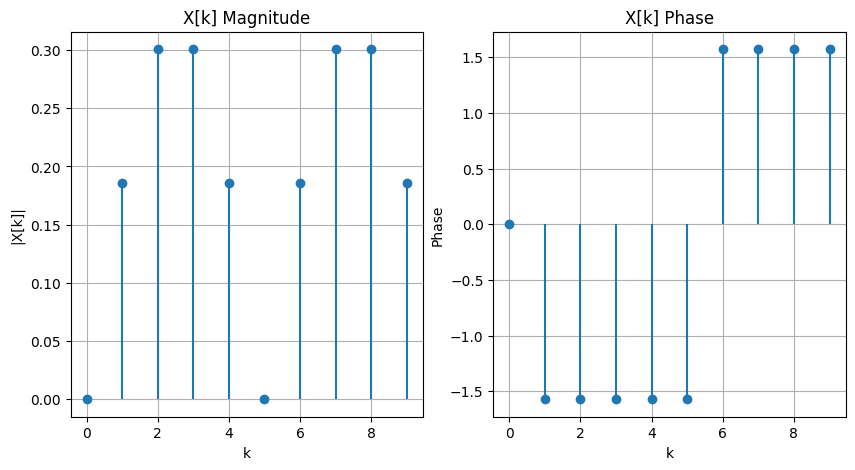

In [22]:
#Retrieving result from 4a and plotting this 
X_4a = (1/np.sqrt(L_4c)) * (-1j * np.sin(2 * np.pi * k_4c / L_4c))

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.stem(k_4c, np.abs(X_4a), basefmt=" ")
plt.xlabel("k")
plt.ylabel("|X[k]|")
plt.title("X[k] Magnitude")
plt.grid(True)

plt.subplot(1,2,2)
plt.stem(k_4c, np.angle(X_4a), basefmt=" ")
plt.xlabel("k")
plt.ylabel("Phase")
plt.title("X[k] Phase")
plt.grid(True)
plt.show()

They match!!

## Question 5:

Consider the following periodic signal, with period $L$ being an **even number**:

  $$x[n] = \begin{cases} 1 & \text{for $n$ even,}\\ -1 & \text{for $n$ odd.}\end{cases}$$

* **(a)** Write an equation for $X[k] = \mathcal{DFT}\{x[n]\}$. Simplify your equation until it is clear that $X[k]$ is real-valued. **Show your steps.**

* **(b)** In Python, construct the signal for $L = 10$. Compute the DFT using ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to the plot of your equation in part (a).

## Answer:

## (a)

## (b) 

In [ ]:
m = 

# For Grads Only (or Extra Credit for Undergrads)

# Question 6:

Consider the following periodic signal, with period $L$ being an **even number**:

$$x[n] = \begin{cases} \cos\left(\frac{2\pi n}{L}\right) & \text{for $n$ even,}\\ -\cos\left(\frac{2\pi n}{L}\right) & \text{for $n$ odd.} \end{cases}$$

* **(a)** Write an equation for $X[k] = \mathcal{DFT}\{x[n]\}$. Simplify your equation until it is clear that $X[k]$ is real-valued. {\bf Show your steps.}

* **(b)** In Python, construct the signal $x[n]$ for $L = 40$. Compute the DFT using the ``numpy.fft.fft`` function. Plot the resulting $X[k]$ and compare it to a plot of your equation in part (a).

## Answer:

## (a)

## (b) 